# 🎥 Gesture Segmentation Tutorial
This notebook demonstrates the workflow for gesture segmentation using a pre-trained model. 
It will guide you through the steps to:

1. Extract 3‑D pose keypoints with *MediaPipe Pose*  
2. Run a pre‑trained gesture‑segmentation model  
3. Export the result to **ELAN** for manual inspection

Let's start👇

## 📑 Notebook overview

1. **Environment setup** — install & import libraries

2. **1️⃣ Extract keypoints** — video → skeletons

3. **2️⃣ Run segmentation** — skeletons → gesture probabilities

4. **3️⃣ Export to ELAN** — tier per threshold

5. **📝 Exercises** — inspect and analyse predictions

## ⚙️ Environment setup

In [1]:
import sys, os, pathlib, json, time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip

from utils.extract_mp_pose import extract_keypoints
from utils.Gesture_Segmentation_to_ELAN import (
    process_and_save_all, smoothed_predictions)
from test_segmentation import (
    parse_args, set_random_seed, train_with_config, get_config)

print('✅ Environment initialised')

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

✅ Environment initialised


In [2]:
# I use these commands to make the notebook interactive and automatically reload modified modules)
%load_ext autoreload
%autoreload 2
%matplotlib inline


## 1️⃣ Extract pose keypoints
Set `video_path` below (file path or `0` for webcam) and run to obtain an **`.npy`** with pose landmarks and an optional overlay clip.

**NOTE if you want to use your own webcam video**:
- Make sure you have a webcam connected to your computer.
- Change the `video_path` to `"0"` (zero) to use the webcam as input.


<div style="background-color: #fff3cd; border: 1px solid #ffeeba; padding: 10px; border-radius: 5px;">
   <strong style="color: #856404;">⚠ WARNING:</strong>
   For this notebook, run the pose extraction for the whole video (since there are parameters below that will need up to 30 seconds of video to work properly). If you want to run it for a shorter video, you can adjust the <code>start_sec</code> and <code>end_sec</code> parameters in the visualization cell at the end of the notebook.
</div>

In [3]:
# --- Configuration -----------------------------------------------------
video_path = 'input_videos/salma_hayek_short.mp4'  # change to your file or 0 for webcam
# video_path = 'input_videos/tedtalk copy.webm'  # change to your file or 0 for webcam


pose_data = extract_keypoints(
    vidf=video_path,
    save_video=True,     # writes overlay MP4 next to the .npy
    visualize=True,
)
print('\033[1;31m✅ with the following saved output:\033[0m')
print('\033[1m✅ Keypoints extracted and saved to:', pose_data['output_path'], '\033[0m')
print('\033[1m✅ Video with keypoints overlay saved to:', pose_data['video_path'], '\033[0m')


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
I0000 00:00:1788528391.456037 21033255 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88.1), renderer: Apple M3 Pro


Video resolution: 1920.0x1080.0, FPS: 29.97002997002997
Number of frames in the video: 1136


Processing frames:   0%|          | 0/1136 [00:00<?, ?frame/s]INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1788528391.527688 21033451 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1788528391.551239 21033457 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1788528391.554113 21033456 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1788528391.554113 21033451 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1788528391.554329 21033459 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabli

✅ with the following saved output:
✅ Keypoints extracted and saved to: input_videos/salma_hayek_short.npy 
✅ Video with keypoints overlay saved to: input_videos/salma_hayek_short.mp4 


The dictionary contains:

* `output_path` – `*.npy` file with the keypoints  
* `video_output_path` – overlay video (optional)  
* `samplerate` – frames‑per‑second of the processed clip

## 2️⃣ Run gesture segmentation

The script below will load and run the gesture segmentation model on the extracted keypoints.

In [4]:
# --- Build CLI‑style arguments ---------------------------------------------
sys.argv = [
    "run_segmentation_test.py",
    "--config",  "config/segmentation/CABB_segment_basic_test.yaml",
    "--poses-path", pose_data["output_path"],
    "--phase",  "test", # DO NOT CHANGE THIS. IF YOU WANT TO TRAIN THE MODEL ON YOUR DATA, CONTACT ESAM GHALEB
    "--seed",   "42",
    "--devices", "0",
    "--models_type", "best" # "best" or "last" (if you want to run the last checkpoint)
]

# --- Parse and run ----------------------------------------------------------
opts = parse_args()
set_random_seed(opts.seed)
cfg = get_config(opts.config)

print(f"=== Running segmentation on {opts.poses_path} ===")
segmentation_results = train_with_config(cfg, opts)

Seed set to 42


=== Running segmentation on input_videos/salma_hayek_short.npy ===
Loading dataset...


Preparing segmentation sequences...: 100%|██████████| 1/1 [00:00<00:00, 19239.93it/s]
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at segmentation_models/fold_1/checkpoints/fold_1/best.ckpt
Loaded model weights from the checkpoint at segmentation_models/fold_1/checkpoints/fold_1/best.ckpt


Starting Fold 1
INFO: Trainable parameter count: 3345161


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│  test/segmentation_loss   │    0.11812177300453186    │
└───────────────────────────┴───────────────────────────┘

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at segmentation_models/fold_2/checkpoints/fold_2/best.ckpt
Loaded model weights from the checkpoint at segmentation_models/fold_2/checkpoints/fold_2/best.ckpt


Starting Fold 2
INFO: Trainable parameter count: 3345161


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│  test/segmentation_loss   │    0.11143745481967926    │
└───────────────────────────┴───────────────────────────┘

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at segmentation_models/fold_3/checkpoints/fold_3/best.ckpt
Loaded model weights from the checkpoint at segmentation_models/fold_3/checkpoints/fold_3/best.ckpt


Starting Fold 3
INFO: Trainable parameter count: 3345161


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│  test/segmentation_loss   │    0.10471539199352264    │
└───────────────────────────┴───────────────────────────┘

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at segmentation_models/fold_4/checkpoints/fold_4/best.ckpt
Loaded model weights from the checkpoint at segmentation_models/fold_4/checkpoints/fold_4/best.ckpt


Starting Fold 4
INFO: Trainable parameter count: 3345161


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│  test/segmentation_loss   │    0.11593708395957947    │
└───────────────────────────┴───────────────────────────┘

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at segmentation_models/fold_5/checkpoints/fold_5/best.ckpt
Loaded model weights from the checkpoint at segmentation_models/fold_5/checkpoints/fold_5/best.ckpt


Starting Fold 5
INFO: Trainable parameter count: 3345161


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│  test/segmentation_loss   │    0.10442488640546799    │
└───────────────────────────┴───────────────────────────┘

Saving results to CABB_Segmentation/fold_5/test_results.pkl


## 3️⃣ Export to ELAN
Convert frame‑wise predictions into tier(s) and save an `.eaf` file.

**Afterwards** you can open the generated `.eaf` file alongside the overlay video to inspect the automatic segmentation.

In [5]:
segmentation_results_per_frame = process_and_save_all(
    segmentation_results.copy(),
    fps           = pose_data['samplerate'],
    model         = 'skeleton',
    thresholds    = [0.50, 0.55, 0.65],
    media_path    = pose_data['video_output_path'],
    audio_path    = pose_data['video_output_path'].replace('.mp4', '.wav'),
    elan_template = pose_data['video_output_path'].replace('.mp4', '.eaf'),
    smoothing_window = 40,
)
print('✅ ELAN file ready!')

Processing threshold: 0.50


100%|██████████| 1/1 [00:00<00:00, 10.89it/s]


Processing threshold: 0.55


100%|██████████| 1/1 [00:00<00:00,  8.80it/s]


Processing threshold: 0.65


100%|██████████| 1/1 [00:00<00:00,  5.78it/s]

ELAN file saved with all thresholds used: input_videos/salma_hayek_short_output.eaf
✅ ELAN file ready!


In [6]:
segmentation_results_per_frame.head(10)  # Display the first 10 rows of the results

,label,pair_speaker,start_frame,end_frame,pred_n,pred_g,gesture_prob,gesture_bin,speaker
0,0,077_B,0,120,-0.178797,0.143703,0.579933,False,B
1,0,077_B,0,120,-0.175468,0.132293,0.576338,False,B
2,0,077_B,0,120,-0.166946,0.138161,0.575690,False,B
3,0,077_B,0,120,-0.147823,0.113030,0.564846,False,B
4,0,077_B,0,120,-0.180468,0.145109,0.580683,False,B
5,0,077_B,0,120,-0.207223,0.161055,0.591043,False,B
6,0,077_B,0,120,-0.257207,0.199613,0.612260,False,B
7,0,077_B,0,120,-0.387326,0.289634,0.663060,True,B
8,0,077_B,0,120,-0.397489,0.283572,0.663976,True,B
9,0,077_B,0,120,-0.390576,0.273826,0.660249,True,B


## 📝 Exercise 1 — display a segmented clip
Use the helper **`display_segmented_clip`** to watch a video excerpt with frame‑level segmentation overlay. Fill in the time window you want to inspect.

In [7]:
def display_segmented_clip(from_ts: float, to_ts: float, video_path: str):
    """Display sub‑clip with embedded player in notebook."""
    clip = (
        VideoFileClip(video_path, verbose=False).resize(height=480)  # Resize for better display
        .subclip(from_ts, to_ts)
    )
    return clip.ipython_display(embed=True, verbose=False)

def plot_gesture_predictions(df: pd.DataFrame, fps: int, start: float, end: float, threshold=0.55):
    start_f, end_f = int(start * fps), int(end * fps)
    raw = df['gesture_prob'].values[start_f:end_f]
    times = np.arange(start_f, end_f) / fps
    
    plt.figure(figsize=(12, 5))
    plt.plot(times, raw, 'o-', label='Raw', alpha=0.6)
    plt.axhline(threshold, ls='--', c='red', label=f'Th={threshold}')
    plt.xlabel('Time (s)'); plt.ylabel('Probability'); plt.grid(True)
    plt.legend(); plt.show()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


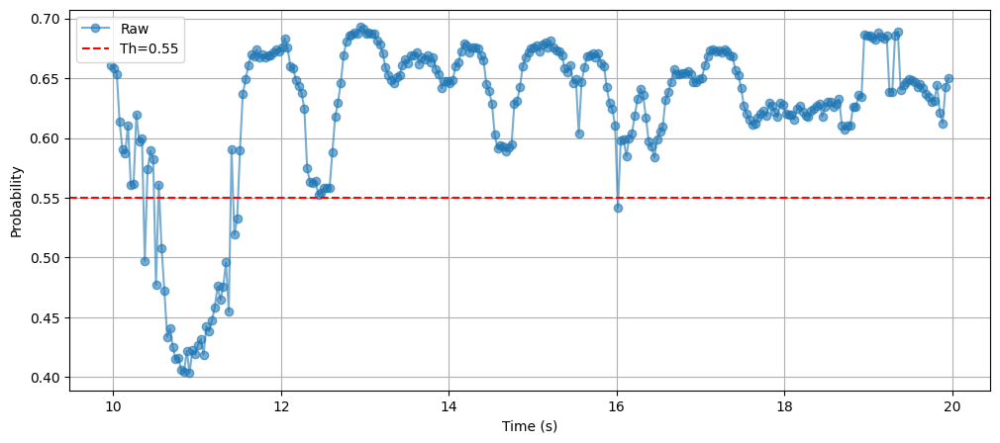

None

In [8]:
# 👉 Set start / end seconds and run the cell
start_sec = 10
end_sec   = 20

display(display_segmented_clip(start_sec, end_sec, pose_data['video_output_path']))
# 👉 Configure interval and run
display(plot_gesture_predictions(segmentation_results_per_frame, pose_data['samplerate'], start_sec, end_sec, threshold=0.55))

## 📝 Exercise 2 — plot raw vs smoothed probabilities
Visualise gesture probabilities over a time span. Adjust `start_sec`, `end_sec`, and `threshold` as desired.

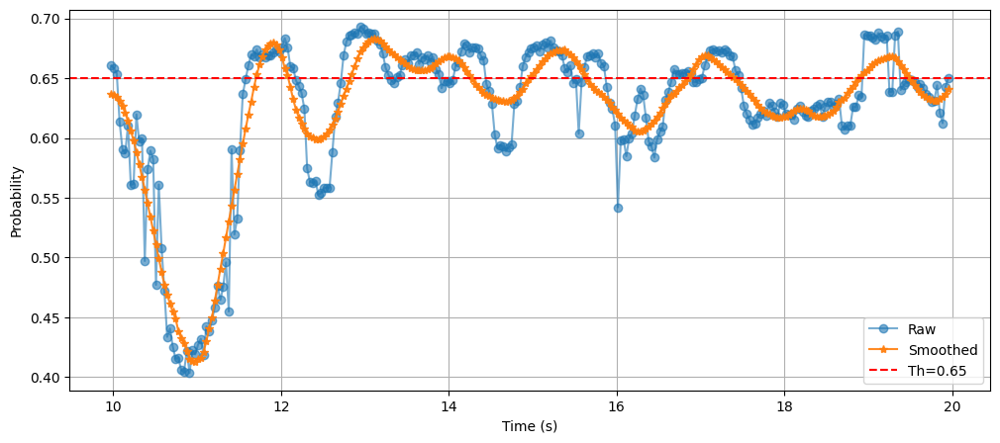

In [9]:
def plot_smoothed(df: pd.DataFrame, fps: int, start: float, end: float, threshold=0.55):
    start_f, end_f = int(start * fps), int(end * fps)
    raw = df['gesture_prob'].values[start_f:end_f]
    times = np.arange(start_f, end_f) / fps
    sm  = smoothed_predictions(raw, smoothing_window=40, polyorder=3)
    
    plt.figure(figsize=(12, 5))
    plt.plot(times, raw, 'o-', label='Raw', alpha=0.6)
    plt.plot(times, sm, '*-', label='Smoothed', alpha=0.9)
    plt.axhline(threshold, ls='--', c='red', label=f'Th={threshold}')
    plt.xlabel('Time (s)'); plt.ylabel('Probability'); plt.grid(True)
    plt.legend(); plt.show()

# 👉 Configure interval and run
start_sec, end_sec = 10, 20
plot_smoothed(segmentation_results_per_frame, pose_data['samplerate'], start_sec, end_sec, threshold=0.65)

In [10]:
from moviepy.editor import CompositeVideoClip, VideoClip
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

def build_composite(video_path: str, df: pd.DataFrame, fps: int,
                   start: float, end: float, threshold: float = 0.55,
                   h_px=720):
    start_f, end_f = int(start*fps), int(end*fps)
    raw = df['gesture_prob'].values[start_f:end_f]
    sm  = smoothed_predictions(raw, smoothing_window=40, polyorder=3)
    times = np.arange(start_f, end_f)/fps
    duration = end - start

    def make_plot_frame(t):
        idx = int(np.clip(t*fps, 0, len(times)-1))
        fig, ax = plt.subplots(figsize=(6, 4), dpi=100)
        ax.plot(times[:idx], raw[:idx], 'o-', label='Raw', alpha=0.5)
        ax.plot(times[:idx], sm[:idx], '*-', label='Smoothed', alpha=0.9)
        ax.axhline(threshold, ls='--', c='red', label='Th')
        ax.set_xlim(times[0], times[-1])
        ax.set_ylim(min(raw), max(raw))
        ax.legend(); ax.grid(True)
        canvas = FigureCanvas(fig); canvas.draw()
        w, h = fig.canvas.get_width_height()
        img = np.frombuffer(canvas.buffer_rgba(), np.uint8).reshape(h, w, 4)[..., :3]
        plt.close(fig)
        return img

    clip_plot  = VideoClip(make_plot_frame, duration=duration).set_fps(fps)
    clip_video = VideoFileClip(video_path).subclip(start, end)
    clip_plot  = clip_plot.resize(height=h_px)
    clip_video = clip_video.resize(height=h_px)
    comp = CompositeVideoClip([
        clip_video.set_position(('left', 'center')),
        clip_plot.set_position((clip_video.w, 'center'))
    ], size=(clip_video.w+clip_plot.w, h_px))
    return comp

# 👉 Uncomment to render (may take time)
composite = build_composite(pose_data['video_output_path'], segmentation_results_per_frame,
                             pose_data['samplerate'], start=10, end=15, threshold=0.55)
composite.ipython_display(embed=True, verbose=False)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## 📝 Exercise 4 — experiment with thresholds
In the ELAN export step (Step 3️⃣) you can modify the `thresholds` list. Try different values and inspect how segment boundaries change.

You can also try different values for `smoothing_window`, which controls the smoothing of the gesture probabilities. A larger value will result in smoother predictions, while a smaller value will be more sensitive to fluctuations.

## 📝 Exercise 5 — checkpoint comparison
In Step 2️⃣, switch `--models_type` between `'best'` and `'last'` in the segmentation step. Which model generalises better to your data?